# AI Launch Lab - Sea Ice Movement Challenge - Training

In [1]:
%matplotlib inline 
import pandas as pd
import pickle
import os 
pd.options.mode.chained_assignment = None
import datetime
import numpy as np
import os
import zipfile
import modules.ml_pipeline.readdata as mlpp
import sys

This notebook contains plots using the interactive plotting library named *Plotly*. These plots are not visible in GitHub.  To view the plots in the notebook, follow this link to the nbviewer version of this notebook: https://nbviewer.jupyter.org/github/Climate-Crisis-AI-Team-Vel-Ice/sea-ice-challenge/blob/master/sea_ice_data_visualization.ipynb

### Load the data from disk and display it.

In [2]:
# unzip the zip dataset
with zipfile.ZipFile('data/converted_full.zip', 'r') as zip_ref:
    zip_ref.extractall('data')

# Load the raw data to disk
input_path = "data/converted.csv"
df = pd.read_csv(input_path)

# Convert all column names to lower case and display the dataframe 
df = df.rename(str.lower, axis='columns')

## Data Analysis and Visualization 

### Visualize the variables using a scatter plot

The scatterplot matrix helps to quickly identify which variables are correlated with each other and what kind of relationships they share. We can tell whether some variables are positively or negatively correlated. The strongest relationships lie where a thin line is visible.

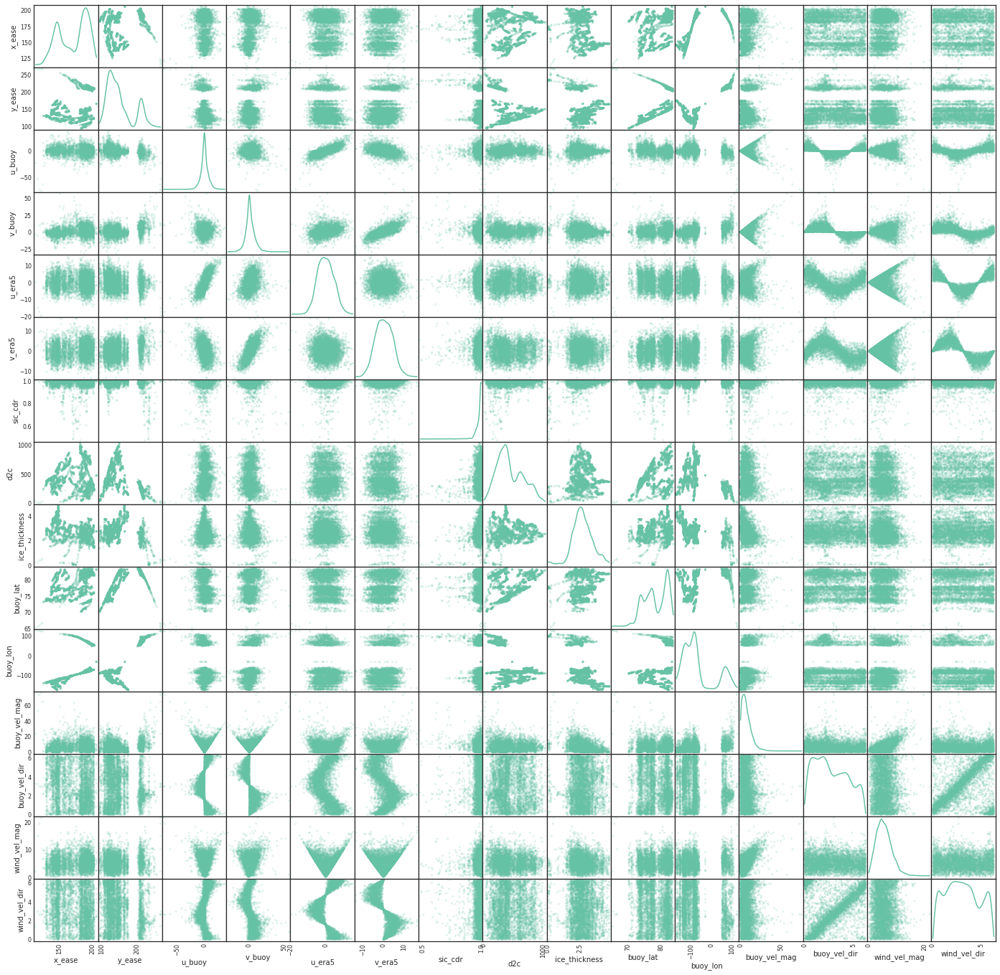

In [3]:
from pandas.plotting import scatter_matrix, andrews_curves, parallel_coordinates
import matplotlib.pyplot as plt

# plot some of the features (not needed in the plot)
scatter_df = df.drop(["index","year","day", "doy", "month", "id_buoy"], axis=1)

# create a scatter matrix plot of the training data 
scatter = scatter_matrix(scatter_df.head(5000), alpha=0.2, figsize=(24, 24), diagonal="kde")
#plt.savefig('sea_ice_velocity_scatter_matrix.png')

Observing the scatter plot, there are some interesting trends to notice here:

1) We are trying to predict the buoy velocity direction (buoy_vel_dir), and buoy velocity magnitude (buoy_vel_mag) which are directly correlated with the ice velocity speed. There is a strong relationship that is visible between the buoy_vel_mag, wind velocity magnitude (wind_velocity_mag) and a small (but noticeable) relationship between the two variables and the ice thickness. This makes sense, because the stronger the wind, the further the buoy will be pushed, and the more ice under the buoy, a stronger wind force will be needed to push the mass under it. 

2) Looking at buoy_vel_dir, it is clear that there is also a relationship between this variable and the wind velocity dir (wind_vel_dir), which is also expressed by v_era5 and u_era5. The variables that are inversely correlated, such as the v-component and the wind (v_era5) and the u-component of the wind (u_era5), and buoy_velocity magnitude. If the dot product of v and u is low, then the buoy is stationary. This also makes a lot of sense because the buoy will be pushed by the wind, so they must move in the same direction!

Let's do some more analysis on the data using plotly to see if there are any other characteristics we can observe. 

In [4]:
# Install necessary libraries torun plotly in this notebook
import sys 
!python -m pip install --upgrade pip
!pip install "notebook>=5.3" "ipywidgets>=7.5" # install the plotly library
!pip install chart-studio==1.1.0

In [5]:
# import necessary libraries for dynamic plotting 
#import chart_studio.plotly as py
import plotly.graph_objs as go # import plotly graph objects
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots

# Jupyter Setup 
init_notebook_mode(connected=True) # allows us to visualize the code in a jupyter notebook

In [6]:
# select a random subset of the main dataset
df_subset = df.sample(frac=0.05, replace=True, random_state=1)

### Correlation Map

Here we will create a correlation map to visualize any important correlations between the variables. "Correlation is defined as the strength of the linear relationship between two variables. A correlation coefficient closer to r=1 indicates that when one variable changes, the other variable changes in the same direction (positive or negative) by the same amount. A similar idea applies as the correlation coefficient approaches r=-1, but in this case, the variables have a nearly perfect inverse correlation, meaning that a change in one variable elicits an opposite change in the other variable." https://medium.com/blockforce-capital/seeing-in-the-dark-creating-crypto-heat-map-correlations-with-plot-ly-7154cf362f92

First, we will scale the features in the matrix to be within 0 and 1, and then create a correlation map and other plots with a subset (roughly 1/3) of the data. 

In [7]:
# Normalize the data using min-max Normalization 
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object and scale the data 
scaler = MinMaxScaler() 
columns_normalized = ["month", "d2c","ice_thickness", "buoy_lat", "buoy_lon", "buoy_vel_mag", "buoy_vel_dir", "wind_vel_mag", "wind_vel_dir"]

x = df_subset[columns_normalized].values
x_scaled = scaler.fit_transform(x)
df_temp = pd.DataFrame(x_scaled, columns=columns_normalized, index = df_subset.index)
df_subset[columns_normalized] = df_temp

# Display the normalized data
display(df_subset[columns_normalized].head())

,month,d2c,ice_thickness,buoy_lat,buoy_lon,buoy_vel_mag,buoy_vel_dir,wind_vel_mag,wind_vel_dir
128037,0.272727,0.245373,0.369456,0.564475,0.151471,0.009183,0.357617,0.048776,0.200600
267336,0.363636,0.396167,0.328638,0.609878,0.203397,0.109881,0.173568,0.114116,0.210329
312201,0.272727,0.474189,0.441520,0.819245,0.106307,0.012707,0.250056,0.280380,0.488235
73349,0.727273,0.642565,0.297041,0.707980,0.163461,0.071887,0.930360,0.190571,0.798836
117583,0.909091,0.744549,0.313788,0.917238,0.185577,0.158504,0.610046,0.352394,0.574129


In [8]:
fig = go.Figure(data=go.Heatmap(z = df_subset[columns_normalized].corr(),
                               x = columns_normalized,
                               y = columns_normalized,
                                colorscale= "ylgn"))

fig.update_layout(title="Sea Ice Data Correlation Map")
                
fig.show()

The correlation map also demonstrates some of the trends we saw analyzing the scatter plot. The wind and buoy velocities, as well as the wind and buoy magnitudes, are both highly correlated with each other. Moreover, we can aslo see the inverse relationship between the buoy velocity magnitude and the ice thickness more clearly. 

### Box Plots 

"A boxplot is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile (Q1), median, third quartile (Q3), and “maximum”). It can tell you about your outliers and what their values are. It can also tell you if your data is symmetrical, how tightly your data is grouped, and if and how your data is skewed."
https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51

In [9]:
# Create a box plot to visualize the data distributions
fig = px.box(df_subset[columns_normalized].drop(["month"], axis=1))

fig.update_layout(title="Sea Ice Data Box Plots")

fig.show()

### Distribution Plots

Distribution plots visually assess the distribution of sample data by comparing the empirical distribution of the data with the theoretical values expected from a specified distribution. We can also tell if there are any variables that are skewed or that have irregular distributions. 
https://www.mathworks.com/help/stats/distribution-plots.html

In [10]:
# Distribution Plots
fig = px.histogram(df_subset[columns_normalized].drop(["month"], axis=1), opacity=.7)

fig.update_layout(title="Sea Ice Distributions")

fig.show()

## Data Preprocessing

Here we will clean the data a bit, and remove any points that are either NaNs, rows that are duplicates or rows that are illogical according to the definition of the problem. 

In [11]:
# Do some manipulations on the data and clean it (remove rows of all NaNs, remove duplicates, etc.)

# Remove any rows that have buoy velocity/mag =0 
df = df.drop(df[df["buoy_vel_mag"] == 0].index)

# Remove any rows that have very low ice_thickness  
"""
sea ice concentration of 0.5 means that the surroundings of the buoy is 50% sea ice and 50% open water. So ice concentration of 
1 is full ice cover, while a concentration of 0.1 means there’S barely any ice left at that location!
"""
df = df.drop(df[df["ice_thickness"] < 0.1].index)

# This section could be further refined at a later time.
# We will leave the month for now because it could be an indicator of weather/season 

# Print the dataframe dimensions
print("Sea Ice Movement Datasets")
print("Dataframe final shape: ", df.shape)
display(df)

Sea Ice Movement Datasets
Dataframe final shape:  (327042, 21)


,index,year,month,day,doy,x_ease,y_ease,u_buoy,v_buoy,id_buoy,...,v_era5,sic_cdr,d2c,ice_thickness,buoy_lat,buoy_lon,buoy_vel_mag,buoy_vel_dir,wind_vel_mag,wind_vel_dir
0,0,1979,2,18,49,147.506958,138.582672,-0.797554,1.114740,1906,...,-0.321260,0.990195,522.523298,3.189743,78.007070,-128.549129,1.370671,2.191824,6.711849,3.189490
1,1,1979,2,18,49,146.834778,120.509880,0.643200,0.368754,1913,...,-0.674205,0.966372,412.767669,2.484009,74.498024,-119.750294,0.741408,0.520564,6.851881,3.240164
2,2,1979,2,18,49,130.993561,129.623672,-1.162420,0.243717,1914,...,1.123955,0.996022,362.547379,2.474106,74.003619,-134.786524,1.187695,2.934923,8.896751,3.014921
3,3,1979,2,18,49,147.524719,157.382492,0.919766,0.025784,1918,...,-1.035410,0.982681,381.025629,3.740522,81.019593,-145.578020,0.920127,0.028026,1.496117,3.905953
4,4,1979,2,19,50,147.470963,138.599823,0.380940,1.243485,1906,...,2.537787,0.990302,521.535334,3.188522,78.002077,-128.560665,1.300527,1.273525,3.338513,2.278041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
329883,339472,2019,12,30,364,173.589722,117.012932,-13.455300,-10.662800,25560,...,-4.199740,1.000000,470.197315,0.933125,75.686986,-96.341501,17.168005,3.811734,8.234026,3.676847
329884,339473,2019,12,30,364,193.232056,172.742004,-0.981225,-11.698400,44880,...,-6.012877,1.000000,702.312813,1.517084,86.513431,-29.153877,11.739478,4.628723,6.522125,4.314615
329885,339474,2019,12,30,364,208.421234,142.049896,-7.247925,-5.289890,53005,...,-0.381765,1.000000,360.491321,1.164462,79.286760,-53.579091,8.973035,3.772087,4.630856,3.224141
329886,339475,2019,12,30,364,145.264023,146.109741,-0.913761,2.182150,95020,...,1.119087,1.000000,393.799208,2.010032,79.025667,-135.924079,2.365742,1.967356,2.240471,0.523007


### TO-DO - Add Outlier Removal 

In [12]:
# Code for outlier removal